In [1]:
import numpy as np
import pandas as pd
import re
import matplotlib.pyplot as plt
import seaborn as sns
import muon as mu
import anndata as ad
from muon import prot as pt
import squidpy as sq
import scanpy as sc
import plotnine as p9
import decoupler as dc

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
import liana as li
from liana.method import MistyData
li.__version__

'1.0.0a0'

In [3]:
rna_path = "data/GSE213264/GSM6578062_humantonsil_RNA.tsv.gz"
prot_path = "data/GSE213264/GSM6578071_humantonsil_protein.tsv.gz"

In [4]:
rna = pd.read_csv(rna_path, sep="\t")
prot = pd.read_csv(prot_path, sep="\t")
assert set(rna.X) == set(prot.X)

rna = rna.set_index("X")
prot = prot.set_index("X")
prot = prot.loc[rna.index]
assert np.all(rna.index == prot.index)

In [5]:
# clean protein names
cleaned_names = prot.columns
cleaned_names = [re.sub("\\.[AGCT]{15}", "", s) for s in prot.columns]
cleaned_names = [re.sub("anti\\.mouse\\.human", "", s) for s in cleaned_names]
cleaned_names = [re.sub("anti\\.human\\.mouse", "", s) for s in cleaned_names]
cleaned_names = [re.sub("anti\\.mouse\\.rat\\.human", "", s) for s in cleaned_names]
cleaned_names = [re.sub("anti\\.mouse\\.rat", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Mouse", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Rat", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Human", "", s) for s in cleaned_names]
cleaned_names = [re.sub("isotype\\.Ctrl", "", s) for s in cleaned_names]
cleaned_names = [re.sub("Isotype\\.Ctrl", "", s) for s in cleaned_names]
cleaned_names = [re.sub("\\.\\.k", "", s) for s in cleaned_names]
cleaned_names = [re.sub("\\.+$", "", s) for s in cleaned_names]
cleaned_names = [re.sub("^\\.+", "", s) for s in cleaned_names]
prot.columns = cleaned_names

In [6]:
# get the coordinates
spatial = pd.DataFrame({"id": rna.index.copy(),
                        "x": np.array([int(s.split("x")[0]) for s in rna.index]), 
                        "y": np.array([int(s.split("x")[1]) for s in rna.index])}).set_index("id")
spatial

,x,y
id,,
29x42,29,42
44x36,44,36
34x6,34,6
42x19,42,19
41x6,41,6
...,...,...
2x26,2,26
30x26,30,26
23x48,23,48


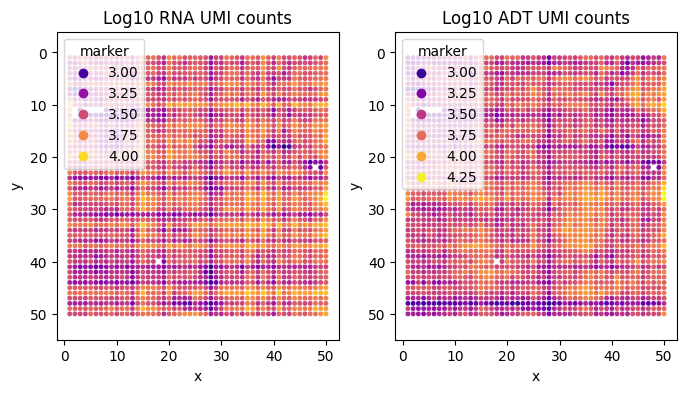

In [7]:
# QC plots
fig, axs = plt.subplots(1, 2, figsize=(8, 4))

plot_df = spatial.copy()
plot_df["marker"] = np.log10(rna.sum(axis=1))
sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], s=15, palette="plasma")
axs[0].axis('equal')
axs[0].invert_yaxis()
axs[0].set_title("Log10 RNA UMI counts")

plot_df = spatial.copy()
plot_df["marker"] = np.log10(prot.sum(axis=1))
sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], s=15, palette="plasma")
axs[1].axis('equal')
axs[1].invert_yaxis()
axs[1].set_title("Log10 ADT UMI counts")
plt.show()

In [8]:
# remove spike ins from rna
print(rna.shape)
spike_bool = np.array(["ERCC" in c for c in rna.columns])
print(spike_bool.sum())
rna = rna.loc[:,~spike_bool]
print(rna.shape)

# remove unmapped from protein
print(prot.shape)
unmapped_bool = np.array(["unmapped" in c for c in prot.columns])
print(unmapped_bool.sum())
prot = prot.loc[:,~unmapped_bool]
print(prot.shape)

(2492, 28417)
29
(2492, 28388)
(2492, 283)
1
(2492, 282)


In [9]:
# make RNA adata object
rna_ad = sc.AnnData(X=rna.values, obs=rna.index.to_frame(name="id"), var=rna.columns.to_frame(name="gene"), obsm={"spatial": spatial})
sc.pp.normalize_total(rna_ad, target_sum=1e4)
sc.pp.log1p(rna_ad)
rna_ad.raw = rna_ad
rna_ad

AnnData object with n_obs × n_vars = 2492 × 28388
    obs: 'id'
    var: 'gene'
    uns: 'log1p'
    obsm: 'spatial'

In [10]:
# infer hallmarks
msigdb = dc.get_resource('MSigDB')
hallmark = msigdb[msigdb['collection']=='hallmark'] # filter by hallmark
hallmark = hallmark[~hallmark.duplicated(['geneset', 'genesymbol'])] # remove duplicates
hallmark.loc[:, 'geneset'] = [name.split('HALLMARK_')[1] for name in hallmark['geneset']] # rename for consistency
hallmark = hallmark.loc[:, ['geneset', 'genesymbol']] # reorder columns

dc.run_ulm(
    mat=rna_ad,
    net=hallmark,
    source="geneset",
    target="genesymbol",
    weight=None,
    verbose=True,
    use_raw=False
)

acts = li.ut.obsm_to_adata(rna_ad, 'ulm_estimate')

333 features of mat are empty, they will be removed.
Running ulm on mat with 2492 samples and 28055 targets for 50 sources.


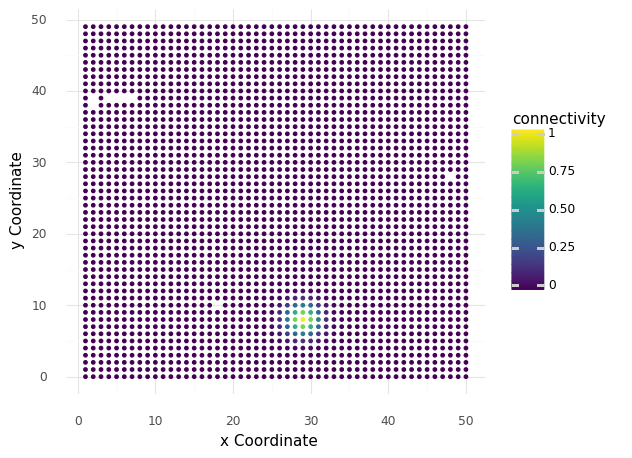

<ggplot: (273586637)>

In [11]:
li.ut.spatial_neighbors(acts, cutoff=0, bandwidth=1.5, set_diag=True)
li.pl.connectivity(acts, idx=0)

In [12]:
# get the extra view
acts_smoothed = acts.copy()
acts_smoothed.X = acts_smoothed.obsp["spatial_connectivities"]@acts_smoothed.X
acts_smoothed

AnnData object with n_obs × n_vars = 2492 × 50
    obs: 'id'
    uns: 'log1p'
    obsm: 'spatial', 'ulm_estimate', 'ulm_pvals'
    obsp: 'spatial_connectivities'

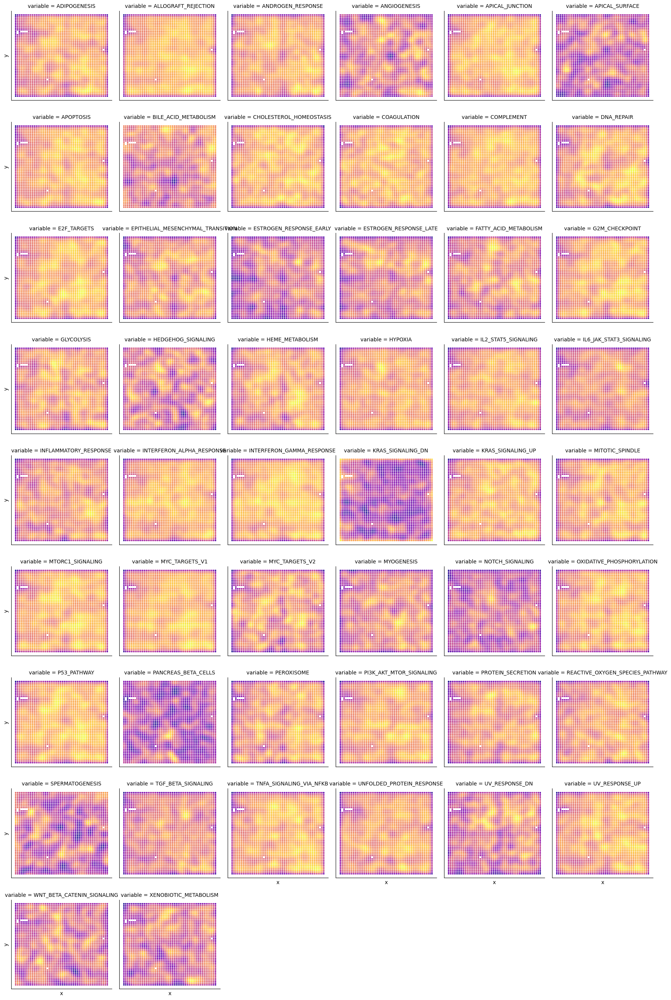

In [13]:
# plot all pathways
df = pd.DataFrame(acts_smoothed.X, index=acts_smoothed.obs.index, columns=acts_smoothed.var.index).reset_index().melt(id_vars="X")

df = df.groupby(["X", "variable"]).mean().reset_index()

df["x"] = np.array([int(s.split("x")[0]) for s in df.X])
df["y"] = np.array([int(s.split("x")[1]) for s in df.X]) * (-1)

g = sns.FacetGrid(data=df, col="variable", col_wrap=6)
scatter_plot = g.map(sns.scatterplot, "x", "y", "value", s=10, palette="plasma")
for ax in g.axes.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
plt.show()

In [14]:
prot_ad = sc.AnnData(X=prot.values, obs=prot.index.to_frame(name="id"), var=prot.columns.to_frame(name="protein"), obsm={"spatial": spatial})
sc.pp.normalize_total(prot_ad, target_sum=1e4)

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [15]:
misty = MistyData(data={"intra": prot_ad, "para": acts})
misty.var_names_make_unique() # otherwise we cannot index
misty

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/mudata/_core/mudata.py:445: UserWarning: var_names are not unique. To make them unique, call `.var_names_make_unique`.


MuData object with n_obs × n_vars = 2492 × 332
  obs:	'id'
  2 modalities
    intra:	2492 x 282
      obs:	'id'
      var:	'protein'
      obsm:	'spatial'
    para:	2492 x 50
      obs:	'id'
      uns:	'log1p'
      obsm:	'spatial', 'ulm_estimate', 'ulm_pvals'
      obsp:	'spatial_connectivities'

In [16]:
#model = ["linear", "rf"]
misty.__call__(model="linear", verbose=True, bypass_intra=True)

Now learning: HLA.DR_.DP_.DQ: 100%|██████████| 282/282 [00:35<00:00,  7.87it/s]               


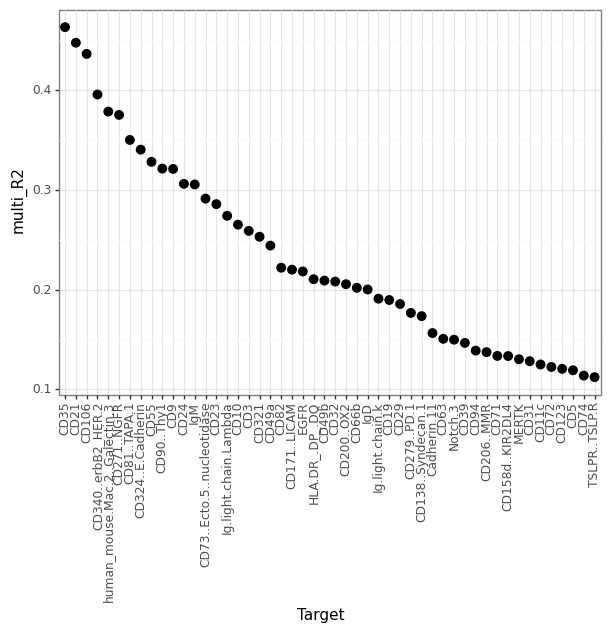

<ggplot: (379591605)>

In [17]:
stat = "multi_R2"
target_metrics = misty.uns['target_metrics'].copy()

target_metrics = target_metrics.sort_values(stat, ascending=False).head(50)

# get order of target by decreasing intra.R2
targets = target_metrics.sort_values(by=stat, ascending=False)['target'].values
# targets as categorical variable
target_metrics['target'] = pd.Categorical(target_metrics['target'],
                                            categories=targets, 
                                            ordered=True)

p = (p9.ggplot(target_metrics, p9.aes(x='target', y=stat)) +
        p9.geom_point(size=3) + 
        p9.theme_bw() +
        p9.theme(axis_text_x=p9.element_text(rotation=90),
                figure_size=(7,5)) +
    p9.labs(x='Target')
    )
p

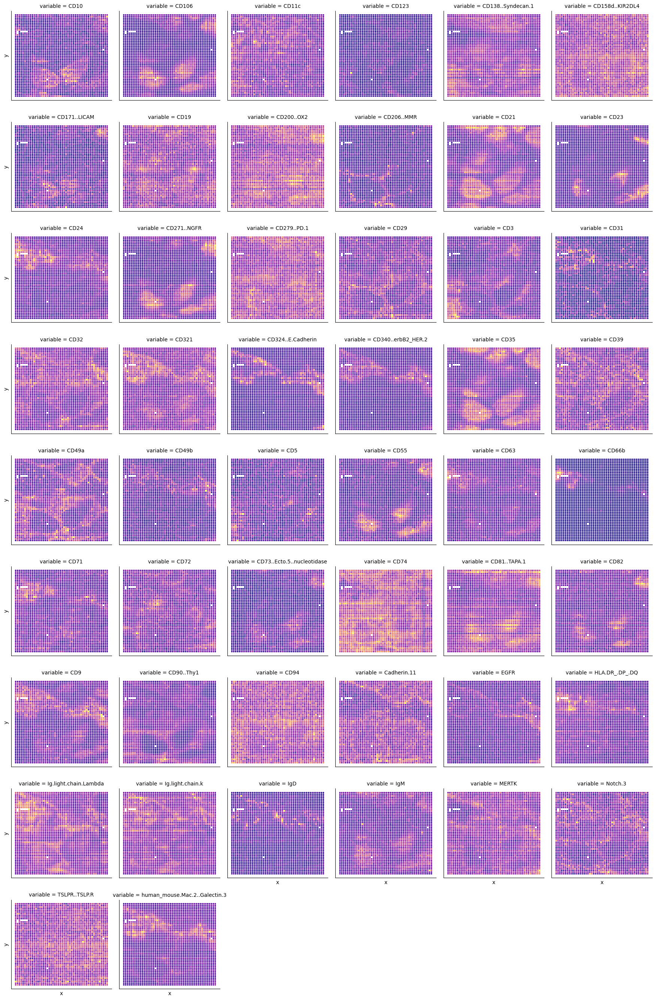

In [18]:
# plot the proteins
df_prot = pd.DataFrame(prot_ad.X.todense(), index=prot_ad.obs.index, columns=prot_ad.var.index).reset_index().melt(id_vars="X")

df_prot = df_prot.groupby(["X", "variable"]).mean().reset_index()

df_prot["x"] = np.array([int(s.split("x")[0]) for s in df_prot.X])
df_prot["y"] = np.array([int(s.split("x")[1]) for s in df_prot.X]) * (-1) # invert y-axis

df_prot = df_prot.loc[np.isin(df_prot.variable, target_metrics.target.to_numpy())]

g = sns.FacetGrid(data=df_prot, col="variable", col_wrap=6)
g.map(sns.scatterplot, "x", "y", "value", s=10, palette="plasma")
for ax in g.axes.flat:
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
plt.show()

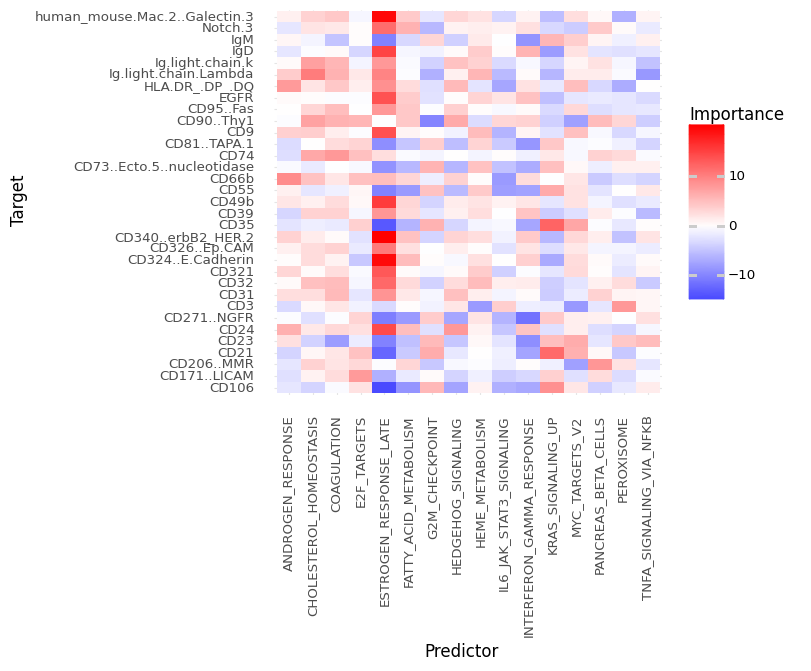

<ggplot: (382130451)>

In [19]:
(
    li.pl.interactions(misty, 'para', return_fig=True, figure_size=(5, 5), top_n=50, key=abs) +
    p9.scale_fill_gradient2(low = "blue", mid = "white", high = "red", midpoint = 0) +
    p9.labs(y='Target', x='Predictor')
)

In [20]:
interactions = misty.uns['interactions'].copy()
interactions = interactions[interactions['view'] == "para"]
grouped = interactions.groupby('predictor')['importances'].apply(lambda x: x.isna().all())
interactions = interactions[~interactions['predictor'].isin(grouped[grouped].index)]
interactions = interactions.sort_values(by='importances', key=None, ascending=False)
# only keep interactions for targets with R2 above 30%
interactions = interactions.loc[np.isin(interactions.target, target_metrics.target[target_metrics.multi_R2 > 0.3])]
interactions

,target,predictor,view,importances
9565,CD340..erbB2_HER.2,ESTROGEN_RESPONSE_LATE,para,19.509031
6665,human_mouse.Mac.2..Galectin.3,ESTROGEN_RESPONSE_LATE,para,18.871645
2315,CD324..E.Cadherin,ESTROGEN_RESPONSE_LATE,para,18.664473
7165,CD24,ESTROGEN_RESPONSE_LATE,para,13.810678
11715,CD9,ESTROGEN_RESPONSE_LATE,para,13.331362
...,...,...,...,...
12265,CD271..NGFR,ESTROGEN_RESPONSE_LATE,para,-9.790351
12276,CD271..NGFR,INTERFERON_GAMMA_RESPONSE,para,-10.805251
3865,CD21,ESTROGEN_RESPONSE_LATE,para,-11.594702
4665,CD35,ESTROGEN_RESPONSE_LATE,para,-12.681060


In [21]:
# plot the top_n interactions as bivariate scores
top_n = 1
top_interactions = interactions.drop_duplicates(['target', 'predictor']).head(top_n)
interactions_subset = interactions[interactions['target'].isin(top_interactions['target']) & 
                                   interactions['predictor'].isin(top_interactions['predictor'])]
interactions_subset = list(zip(interactions_subset['target'], interactions_subset['predictor']))

In [22]:
prot_cluster = sc.AnnData(X=prot.values.copy(), obs=prot.index.to_frame(name="id"), var=prot.columns.to_frame(name="protein"), obsm={"spatial": spatial})
sc.pp.normalize_total(prot_cluster, target_sum=1e4)
sc.tl.pca(prot_cluster, svd_solver='arpack')
sc.pp.neighbors(prot_cluster, n_neighbors=10, n_pcs=20)
sc.tl.leiden(prot_cluster, resolution=0.3)

/Users/pschafer/miniconda3/envs/misty_liana/lib/python3.8/site-packages/anndata/_core/anndata.py:1832: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.


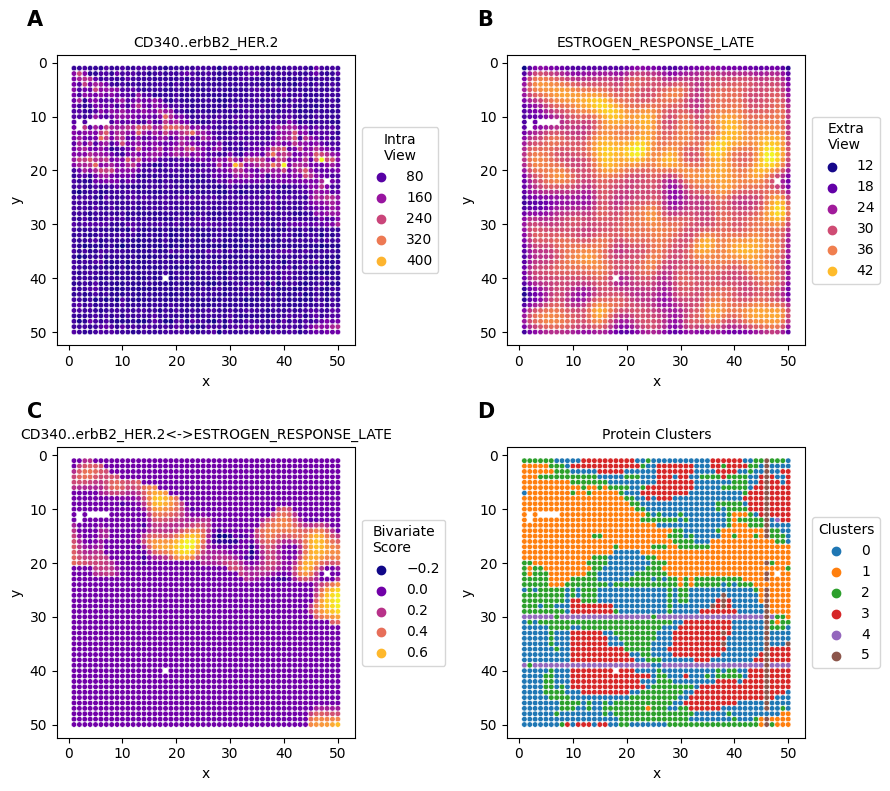

In [38]:
mdata = mu.MuData({"intra": misty.mod["intra"], "para": misty.mod["para"]})
mdata.obsm = misty.mod["para"].obsm
mdata.obsp = misty.mod["para"].obsp
mdata

li.mt.bivar(mdata,
            x_mod="intra",
            y_mod="para",
            x_transform=sc.pp.scale,
            y_transform=sc.pp.scale,
            function_name="cosine",
            interactions=interactions_subset,
            positive_only=True,
            add_categories=True,
            xy_sep="<->",
            )

# marker size
marker_size = 15
marker_shape = "o"

for i in range(len(interactions_subset)):
    var = mdata.mod['local_scores'].var_names[i]
    var1 = var.split("<->")[0]
    var2 = var.split("<->")[1]

    fig, axs = plt.subplots(2, 2, figsize=(9, 8))
    axs = axs.flatten()
    # plot intra
    plot_df = mdata.mod['intra'].obsm["spatial"]
    plot_df["marker"] = np.asarray(mdata.mod['intra'][:, var1].X.todense()).squeeze()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[0], palette="plasma", s=marker_size, marker=marker_shape)
    legend = axs[0].get_legend()
    axs[0].legend(title='Intra\nView', loc='center left', bbox_to_anchor=(1, 0.5))
    axs[0].axis('equal')
    axs[0].invert_yaxis()
    axs[0].set_title(var1, fontsize=10)

    # plot extra
    plot_df = mdata.mod['para'].obsm["spatial"]
    plot_df["marker"] = acts_smoothed[:, var2].X.copy().flatten()
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[1], palette="plasma", s=marker_size, marker=marker_shape)
    legend = axs[1].get_legend()
    axs[1].legend(title='Extra\nView', loc='center left', bbox_to_anchor=(1, 0.5))
    axs[1].axis('equal')
    axs[1].invert_yaxis()
    axs[1].set_title(var2, fontsize=10)

    # plot bivariate
    plot_df = mdata.mod['local_scores'].obsm["spatial"]
    plot_df["marker"] = mdata.mod['local_scores'].X[:, i]
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[2], palette="plasma", s=marker_size, marker=marker_shape)
    legend = axs[2].get_legend()
    axs[2].legend(title='Bivariate\nScore', loc='center left', bbox_to_anchor=(1, 0.5))
    axs[2].axis('equal')
    axs[2].invert_yaxis()
    axs[2].set_title(var, fontsize=10)

    # plot protein clusters
    plot_df = prot_cluster.obsm["spatial"].copy()
    plot_df["marker"] = prot_cluster.obs["leiden"].values
    sns.scatterplot(x='x', y='y', hue='marker', data=plot_df, ax=axs[3], s=marker_size, marker=marker_shape)
    legend = axs[3].get_legend()
    axs[3].legend(title='Clusters', loc='center left', bbox_to_anchor=(1, 0.5))
    axs[3].axis('equal')
    axs[3].invert_yaxis()
    axs[3].set_title("Protein Clusters", fontsize=10)

    # from: https://stackoverflow.com/questions/25543978/annotate-subplots-in-a-figure-with-a-b-c
    import string
    for n, ax in enumerate(axs):
        ax.text(-0.1, 1.1, string.ascii_uppercase[n], transform=ax.transAxes, 
                size=15, weight='bold')

    plt.tight_layout()
    fig.savefig(f"figures/{var}.pdf", bbox_inches='tight')
    plt.show()